# 2D Signal Visualization

## Table of Contents
1. [Overview](#1--overview)
2. [Introduction](#2--introduction)
3. [Loading the Datasets](#3--loading-the-datasets)
4. [Data Exploration](#4--data-exploration)
   - [Sample Visualization](#4.1--sample-visualization)
   - [Dataset Animations](#4.2--dataset-animations)
5. [Data Preprocessing](#5--data-preprocessing)
6. [Processed Data Visualization](#6--processed-data-visualization)
   - [Heatmaps](#6.1--heatmaps)
7. [Dimensionality Reduction](#7--dimensionality-reduction)
   - [PCA Analysis](#7.1--pca-analysis)
   - [t-SNE](#7.2--t\-sne)
   - [UMAP](#7.3--umap)
   - [Evaluations and Performance Analysis](#7.4--evaluations-and-performance-analysis)
8. [Hyperparameter Tuning](#8--hyperparameter-tuning)
9. [Clustering and Classification Analysis](#9--clustering-and-classification-analysis)

## 1- Overview <a name="overview"></a>
This notebook demonstrates 2D visualization techniques for high-dimensional image datasets using:
- Classic dimensionality reduction (PCA)
- Manifold learning (t-SNE, UMAP)
- Interactive visualizations

Key metrics evaluated:
1. **Explained Variance Ratio** (PCA)
2. **KL Divergence** (t-SNE)
3. **Neighborhood Preservation**
4. **Computational Efficiency**

## 2- Introduction <a name="introduction"></a>

**Dataset Characteristics:**
| Feature        | MNIST         | COIL-20       |
|----------------|---------------|---------------|
| Dimensions     | 28x28 (784)   | 128x128 (16384)|
| Classes        | 10 digits     | 20 objects    |
| Sample Size    | 70,000        | 1,440         |
| Data Type      | Handwriting   | Object rotations |

**MNIST**
- 70,000 handwritten digits
- Centered, size-normalized
- Pixel range [0,255] → Normalized to [0,1]

**COIL-20:**
- 20 objects photographed at 5° intervals
- 72 images per object (360° coverage)
- High-resolution (128x128) grayscale

## 3- Loading the datasets

In [2]:
# imports for libraries needed for loading the datasets
import cv2
from sklearn.datasets import fetch_openml
import kagglehub

from tqdm import tqdm
import os

import pandas as pd
import numpy as np

/home/aries/.conda/envs/git-2d/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### MNIST Dataset


In [3]:
mnist = fetch_openml("mnist_784", version=1)
mnist_images = mnist.data.values.reshape(-1, 28, 28)
mnist_labels = mnist.target.astype(int)

#### COIL-20 Dataset

In [4]:
coil_path = kagglehub.dataset_download("cyx6666/coil20")

In [5]:
coil_path

'/home/aries/.cache/kagglehub/datasets/cyx6666/coil20/versions/1'

The function below will help with properly labelling the data we obtain. It was coded simply following the structure of the folders in the kagglehub dataset.

In [6]:
def load_coil20(dataset_path):
    images, labels = [], []
    path = os.path.join(dataset_path, "coil-20")
    folders = os.listdir(path)
    folders.sort(key=lambda x: int(x))
    for folder in folders:
        folder_path = os.path.join(path, folder)
        files = os.listdir(folder_path)
        files.sort(key=lambda x: int(x.split("__")[1].split(".")[0]))
        for filename in files:
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)
            label = filename.split("__")[0].replace(f"obj", "")
            images.append(img)
            labels.append(label)
    return np.array(images), np.array(labels)

coil_images, coil_labels = load_coil20(coil_path)

Let us now visualize the datasets' contents before proceeding to the dimensionality reduction operations.

## 4- Data Exploration

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

### 4.1- Sample Visualization

The function `plot_images` will help us take a look at samples of the data we have, in order to assess if we need to perform any more treatments before moving forward.

In [8]:
def plot_images(images, labels, title):
    indices = np.random.choice(len(images), size=5, replace=False)
    fig, axes = plt.subplots(1, 5, figsize=(10, 2))
    for i, ax in enumerate(axes):
        ax.imshow(images[indices[i]], cmap="gray")
        ax.set_title(f"Label: {labels[indices[i]]}")
        ax.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

#### MNIST Dataset

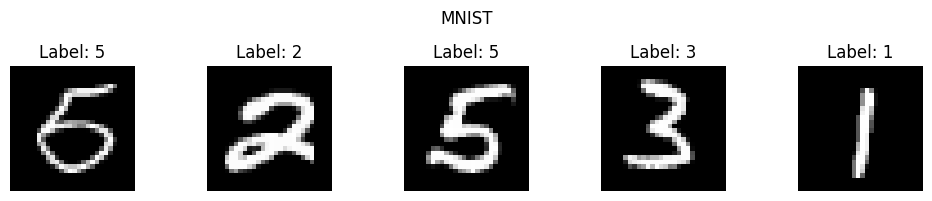

In [9]:
plot_images(mnist_images, mnist_labels, "MNIST")

We can see that the **MNIST** dataset's data is already quite well ordered and will need minimal treatment, only later on for normalization.

#### COIL-20 Dataset

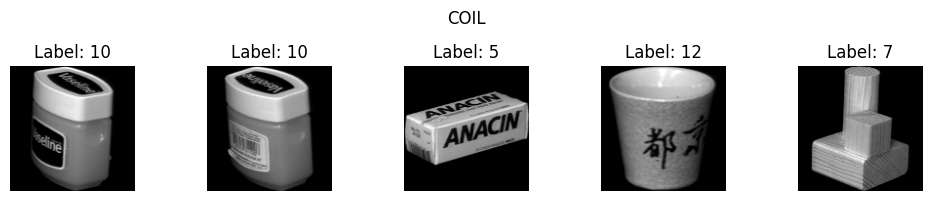

In [10]:
plot_images(coil_images, coil_labels, "COIL")

The **COIL-20** data however might cause us some problems if we keep it at the current resolution, we might think then of reducing the image sizes a bit. Though we do notice that again that there are no borders or extra noise that might impede the data.

### 4.2- Dataset Animations

#### COIL-20 Dataset

We will now display the objects of coil-20 animated using the `animation` module in matplotlib

In [11]:
from matplotlib import animation
from IPython.display import Image

As our labels are all flattened within a 1d array. We can sort through the images by checking the index at which the image label changes.

In [12]:
coil_indexes = [0] + [i+1 for i in range(len(coil_labels)-1) if coil_labels[i] != coil_labels[i+1]] + [len(coil_labels)]

We first create the images using the animation library, then direct all output to the `gifs/` folder. Let us consider the image class 4 for instance.

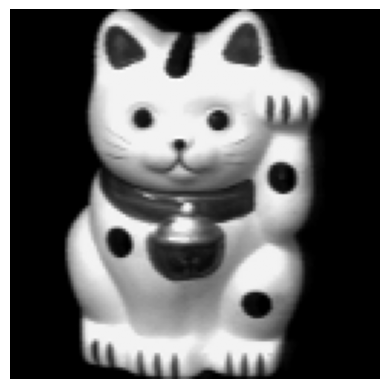

In [13]:
i = 3 # indexes start at 0, so this is the 4th object
start_idx = coil_indexes[i]
end_idx = coil_indexes[i+1]
coil_sequence = coil_images[start_idx:end_idx]

fig, ax = plt.subplots()
ax.axis("off")
im = ax.imshow(coil_sequence[0], cmap="gray")

def update_coil(frame):
    im.set_array(coil_sequence[frame])
    return [im]

ani = animation.FuncAnimation(
    fig,
    update_coil,
    frames=len(coil_sequence),
    interval=100,
    blit=False
)
output_dir = "gifs"
os.makedirs(output_dir, exist_ok=True)
ani.save(f"{output_dir}/coil_animation{i}.gif", writer="pillow", fps=10)


It's the japanese lucky cat! Let's see what its animation looks like:

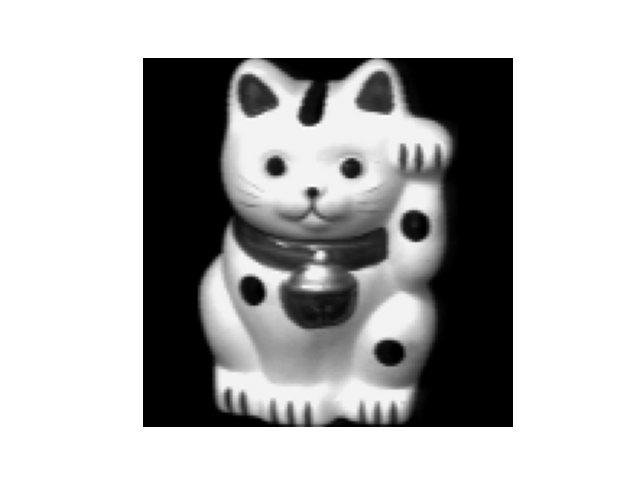

In [14]:
Image(filename=f"{output_dir}/coil_animation{i}.gif")

#### MNIST Dataset

Operating nearly the same way, let us pick the number 7 from the MNIST dataset and display a sample of its collected images.

In [15]:
n = 7
mnist_sequence = [mnist_images[i] for i in range(len(mnist_labels)) if mnist_labels[i] == n]
# limit the sequence to only 100 images
mnist_sequence = mnist_sequence[:100]

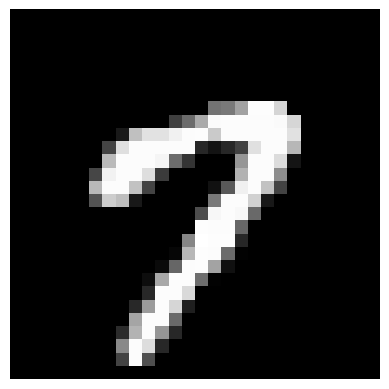

In [16]:
fig, ax = plt.subplots()
ax.axis("off")
im = ax.imshow(mnist_sequence[0], cmap="gray")

def update_mnist(frame):
    im.set_array(mnist_sequence[frame])
    return [im]

ani = animation.FuncAnimation(
    fig,
    update_mnist,
    frames=len(mnist_sequence),
    interval=100,
    blit=False
)

ani.save(f"{output_dir}/mnist_animation{n}.gif", writer="pillow", fps=10)

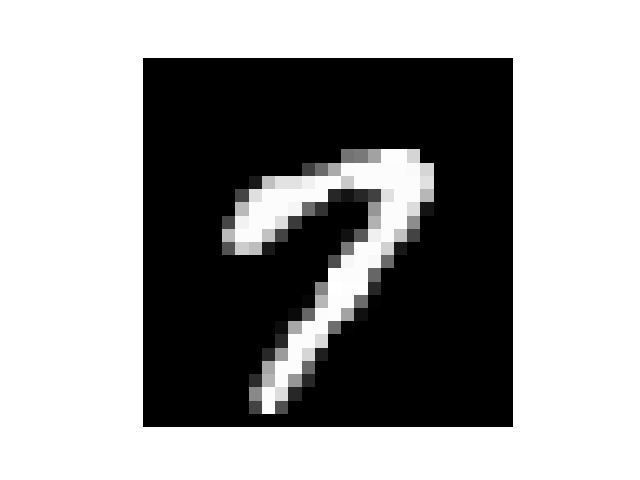

In [17]:
Image(filename=f"{output_dir}/mnist_animation7.gif")

## 5- Data Preprocessing

In [18]:
from sklearn.preprocessing import StandardScaler

We will follow this normalization pipeline for the best results later on:

1. Resize to 28x28
2. Flatten to 1D vectors
3. Standard scaling (z-score normalization)
4. Min-max scaling (0-1 normalization)

In order to optimize run-time for all subseding computations, it is best to first reduce the size of the images of the **COIL-20** dataset.

In [19]:
def reduce_image_size(image, size=(28, 28)):
    return cv2.resize(image, size, interpolation=cv2.INTER_AREA)

coil_resized = np.array([reduce_image_size(img) for img in coil_images])

To normalize our data using scikit-learn's `Standard Scaler`, it needs to initially be flattened to a 1D array.

In [20]:
# flattening the images
mnist_flat = mnist_images.reshape(mnist_images.shape[0], -1)
coil_flat = coil_resized.reshape(coil_resized.shape[0], -1)

# fit within pandas dataframes with labels
mnist_df = pd.DataFrame(mnist_flat)
mnist_df['label'] = mnist_labels

coil_df = pd.DataFrame(coil_flat)
coil_df['label'] = coil_labels

In [21]:
print(f"MNIST shape: {mnist_df.shape}")
display(mnist_df.head())
print(f"COIL shape: {coil_df.shape}")
display(coil_df.head())

MNIST shape: (70000, 785)


,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9


COIL shape: (1440, 785)


,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,label
0,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,1
1,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,1
2,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,1
3,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,1
4,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,1


Now that it is flattened, it is fit for normalization. 

In [22]:
scaler = StandardScaler()
mnist_normalized = scaler.fit_transform(mnist_flat)
coil_normalized = scaler.fit_transform(coil_flat)

## 6- Processed Data Visualization

### 6.1- Heatmaps

We can start by working on defining how this normalized data should be mapped.

One approach, suggested by the assignment, is to use the `z-score` which relies on the mean of the images of each class and compares how each image within that class fits into it.



In [23]:
def compute_class_means(normalized_data, labels, unique_labels, image_shape):
    class_means = []
    for label in unique_labels:
        mask = labels == label
        class_data = normalized_data[mask]
        class_mean = np.mean(class_data, axis=0)
        class_means.append(class_mean.reshape(image_shape))
    return class_means

def plot_class_heatmaps(normalized_data, labels, class_names, image_shape, title, nrows, ncols):
    unique_labels = np.unique(labels)
    n_classes = len(unique_labels)
    class_means = compute_class_means(normalized_data, labels, unique_labels, image_shape)

    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 3*nrows))
    for i, ax in enumerate(axes.flat):
        if i < n_classes:
            sns.heatmap(class_means[i], ax=ax, cmap='RdBu', center=0, cbar=False)
            ax.set_title(f"{class_names[i]}")
            ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

#### MNIST Dataset

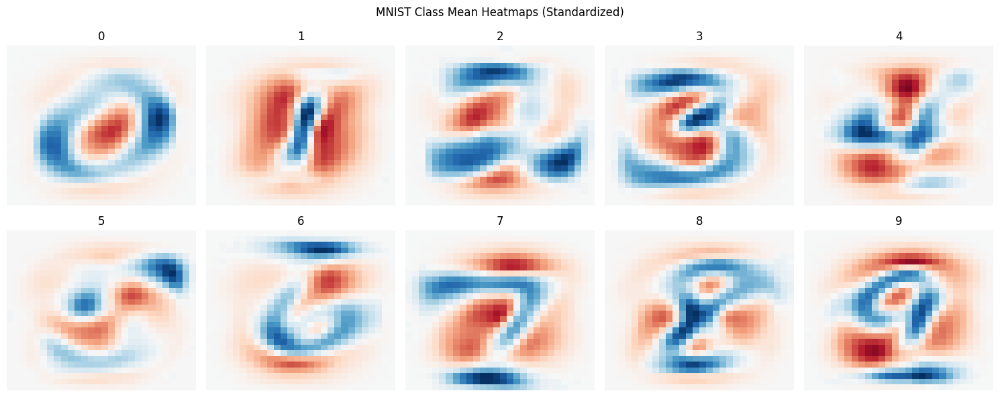

In [24]:
mnist_class_names = [str(i) for i in range(10)]
plot_class_heatmaps(mnist_normalized, mnist_labels, mnist_class_names, (28, 28),
                    "MNIST Class Mean Heatmaps (Standardized)", 2, 5)

Some patterns are already starting to emerge, as we notice the images of each class have certain lines that always overlap for the **MNIST** dataset, this is especially more noticeable for the number **0**.

#### COIL-20 Dataset

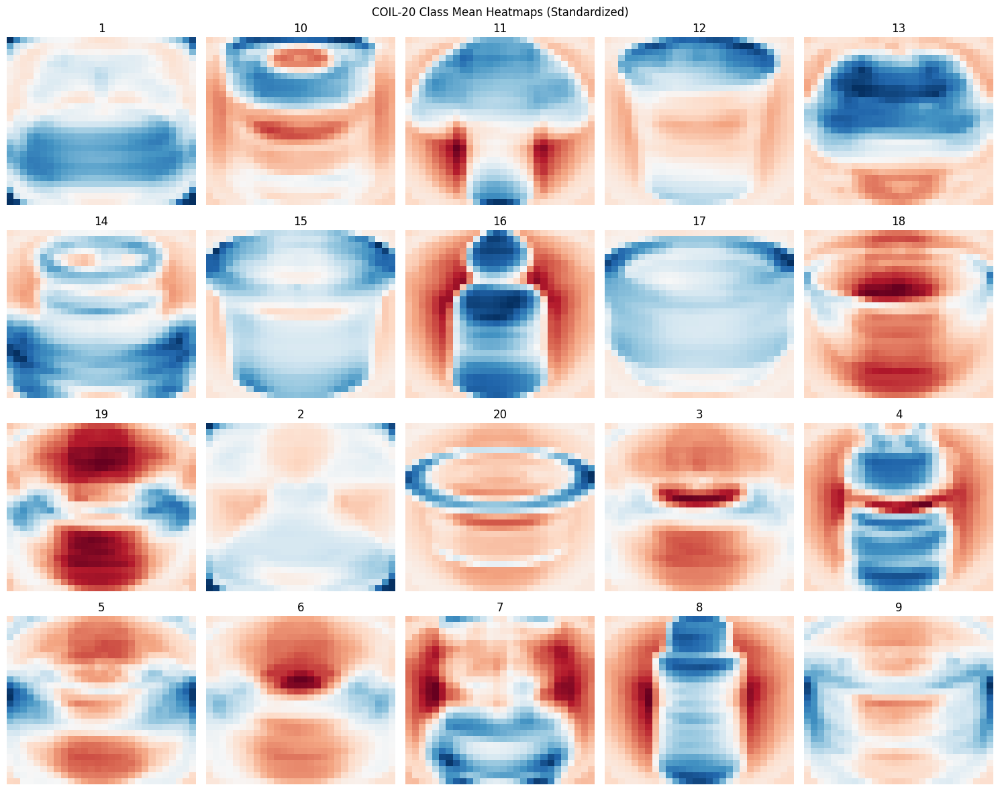

In [25]:
coil_class_names = np.unique(coil_labels)
plot_class_heatmaps(coil_normalized, coil_labels, coil_class_names, (28, 28),
                    "COIL-20 Class Mean Heatmaps (Standardized)", 4, 5)

The rotational aspect of the COIL-20 dataset is vividly present in these heatmaps, offering a clear depiction of the object's orientation changes. 
However, we notice that the simpler cylindrical shapes are much more faithfully captured than the rest where shapes and details tend to overlap more heavily and sometimes cancel each other out, this is particularly true for shapes like **2**, **6** and **19** that are almost not recognizable anymore.

### 6.2- Parallel Plots

There was an initial trial at modelling all 70000 samples of the data- That caused my laptop to crash twice. For that reason we will be modelling only a sample of the data for the `mnist` dataset.

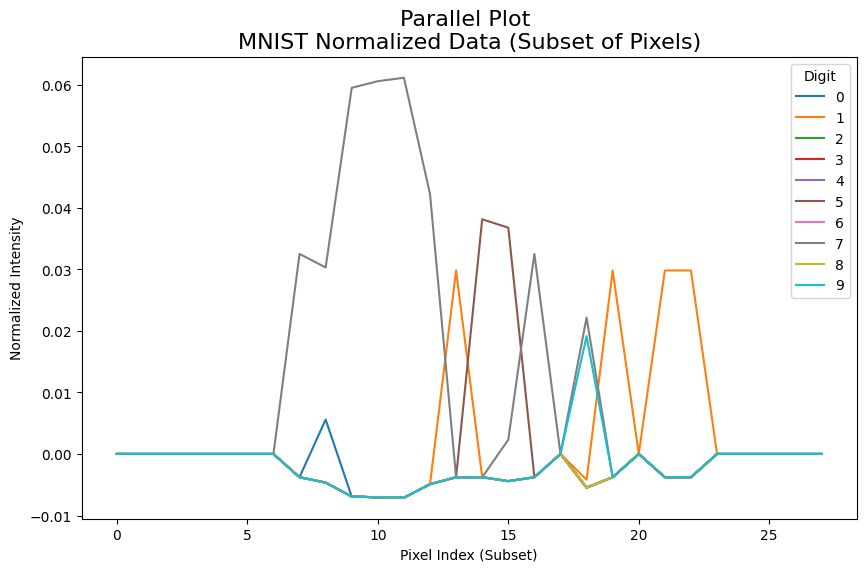

In [26]:
subset_idx = np.random.choice(mnist_normalized.shape[0], 100, replace=False)
mnist_subset = mnist_normalized[subset_idx]

# average pixel intensities per class to avoid overcrowding
unique_labels = np.unique(mnist_labels)
class_means = np.array([mnist_normalized[mnist_labels == label].mean(axis=0) for label in unique_labels])

# selecting a subset of pixels
selected_features = np.arange(0, 784, 28)
class_means_subset = class_means[:, selected_features]

# converting to pandas dataframe for optimized rendering
df = pd.DataFrame(class_means_subset.T, columns=unique_labels)

plt.figure(figsize=(10, 6))
parallel_plot = sns.lineplot(data=df, dashes=False, markers=False)

plt.title('Parallel Plot \nMNIST Normalized Data (Subset of Pixels)', fontsize=16)
plt.xlabel("Pixel Index (Subset)")
plt.ylabel("Normalized Intensity")
plt.legend(title='Digit', bbox_to_anchor=(1, 1))  # Shift legend to the right
plt.show()

The pixel classes are largely situated in the middle, which is logical considering the heatmaps we observed earlier of the mnist images.

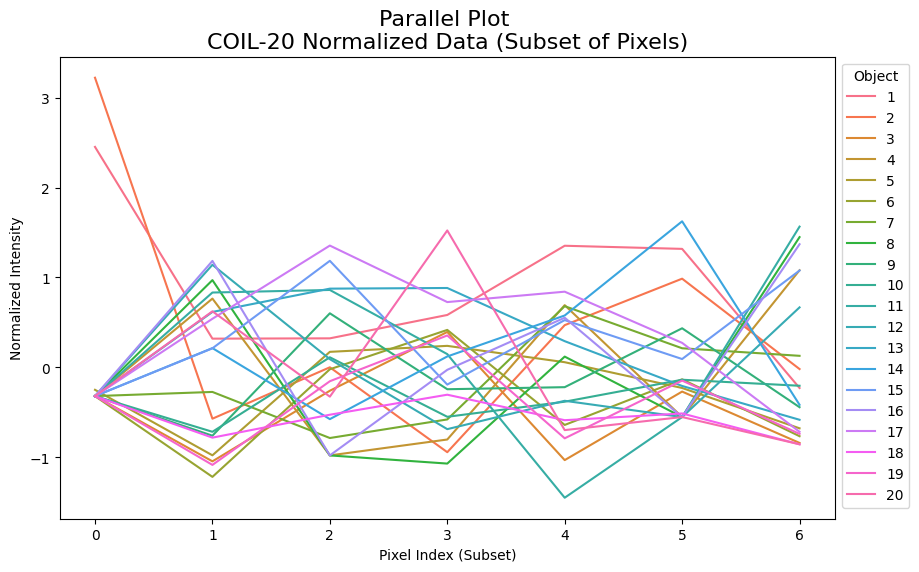

In [27]:
subset_idx = np.random.choice(coil_normalized.shape[0], 100, replace=False)
coil_subset = coil_normalized[subset_idx]

unique_labels = sorted(np.unique(coil_labels), key=lambda x: int(x))
class_means = np.array([coil_normalized[coil_labels == label].mean(axis=0) for label in unique_labels])

selected_features = np.arange(0, coil_normalized.shape[1], 128)  # Adjust stride for COIL-20
class_means_subset = class_means[:, selected_features]

df = pd.DataFrame(class_means_subset.T, columns=unique_labels)

plt.figure(figsize=(10, 6))
parallel_plot = sns.lineplot(data=df, dashes=False, markers=False)

plt.title('Parallel Plot \nCOIL-20 Normalized Data (Subset of Pixels)', fontsize=16)
plt.xlabel("Pixel Index (Subset)")
plt.ylabel("Normalized Intensity")
plt.legend(title='Object', bbox_to_anchor=(1, 1))
plt.show()

## 7- Dimensionality Reduction

From the **IBM Machine Learning Documentation**:

> Dimensionality reduction simplifies datasets by reducing the number of features while preserving key patterns. This preprocessing technique eliminates irrelevant, redundant, or noisy variables by transforming high-dimensional data into lower-dimensional representations through feature extraction or combination.

We will be exploring in this guise three methods: **PCA**, **t-SNE** and **UMAP**. Each one will be explored for the case of **2D** and **3D** dimensionality reduction and compared.

In [28]:
import time
import psutil
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, silhouette_score
from nxcurve import quality_curve

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

Before getting to the methods, we define the following function for testing accurately the results for each method in addition to any visualization comparisons.

In [29]:
def evaluate_method(red_method, data, labels, **kwargs):
    """
    Evaluate the given dimensionality reduction method and collect metrics.
    
    Parameters:
        red_method (str): reduction method, e.g: 'PCA', 't-SNE', or 'UMAP'
        data (np.ndarray): High-dimensional data.
        labels (np.ndarray): Ground truth labels.
        kwargs: method-specific parameters.
    
    Returns:
        reduced (np.ndarray): Reduced data.
        accuracy (float): Classification accuracy (%) using KNN.
        exec_time (float): Execution time in seconds.
        memory_used (float): Memory used in MB.
        quality_score (float): Silhouette score to approximate quality.
    """
    
    # record starting memory and time
    process = psutil.Process()
    mem_before = process.memory_info().rss / 1024 / 1024  # bytes to MB
    start_time = time.time()
    
    reducer = red_method(**kwargs)
    reduced = reducer.fit_transform(data)
    
    # execution time and memory usage
    exec_time = time.time() - start_time
    mem_after = process.memory_info().rss / 1024 / 1024  # in MB
    memory_used = mem_after - mem_before
    
    # classification accuracy on reduced data using a KNN classifier
    X_train, X_test, y_train, y_test = train_test_split(reduced, labels, test_size=0.3, random_state=42)
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train, y_train)
    accuracy = accuracy_score(y_test, knn.predict(X_test)) * 100  # as percentage
    
    # quality metric: silhouette score on the reduced features
    quality_score = silhouette_score(reduced, labels)
    
    metrics = [
        accuracy,
        exec_time,
        memory_used,
        quality_score
    ]
    
    return reducer, reduced, metrics

### 7.1- PCA 

>**Principal component analysis**, or PCA, reduces the number of dimensions in large datasets to principal components that retain most of the original information. It does this by transforming potentially correlated variables into a smaller set of variables, called principal components.

It is by far the most popular dimensionality reduction method as it is computationally fast and easy to interpret mathematically. Thanks to its linear algebra approach, it is also well adapted to preserving the global structure.

#### Testing with 2D

The function below is designed to visualize the 2D results for the MNIST and COIL-20 datasets. 

It plots the first two principal components in a 2D plane using scatterplots. Additionally, it includes class mean markers, which represent the average position of elements within each class, providing insight into how clusters align with their respective means. Red arrow markers are also displayed to indicate variance, where longer arrows signify greater variance.

In [30]:
def plot_pca(scores, loadings, labels, title, colors):
    # plotting the pca results
    plt.figure(figsize=(12, 8))

    scatter = plt.scatter(scores[:, 0], scores[:, 1], c=labels, alpha=0.5, cmap=colors)
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # class means markers
    unique_labels = np.unique(labels)
    class_means = np.array(compute_class_means(scores, labels, unique_labels, (2,)))

    plt.scatter(class_means[:, 0], class_means[:, 1], c=unique_labels, cmap=colors,
                s=200, edgecolor='k', marker='D', label='Class Means')

    # red arrows to check variance
    for i, (x, y) in enumerate(loadings):
        plt.arrow(0, 0, x, y, color='r', width=0.01, head_width=0.05)
        plt.text(x * 1.2, y * 1.2, f"Pixel{i}", color='r')

    cbar = plt.colorbar(scatter, ticks=np.arange(len(unique_labels)), cmap=colors)
    cbar.set_label('Digit')
    cbar.set_ticklabels(np.arange(len(unique_labels)))

    plt.title(title)
    plt.legend()
    plt.show()

##### MNIST

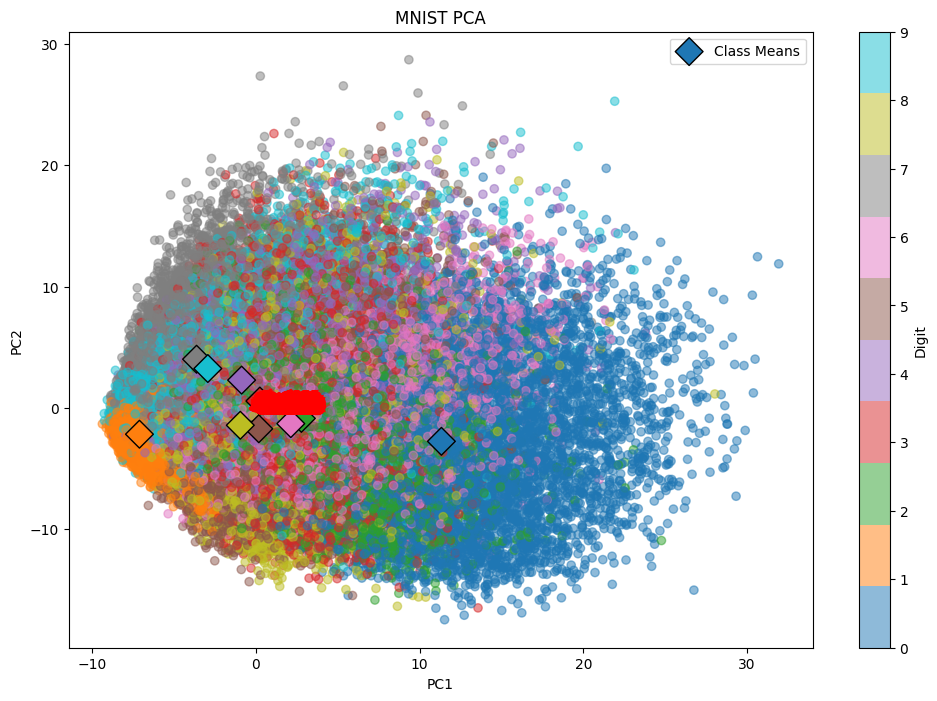

In [31]:
mnPCA2, mnPCA2_data, mnPCA2_met = evaluate_method(PCA, mnist_normalized, mnist_labels, n_components=2)
loadings = mnPCA2.components_.T * np.sqrt(mnPCA2.explained_variance_)
plot_pca(mnPCA2_data, loadings, mnist_labels, "MNIST PCA", "tab10")

From the principal components extracted and the red arrows points, we notice that the zero shape is the most influential in placing the numbers. The data still is quite packed, but we can notice some clusters, particularly for the numbers 0, 1 and 7.

We can already notice how the pca has divided the data so that 7 is closer to 1 than to 0, and most of the numbers fall between the two extremes.

Very little variance exists between the different data points, as they are all tightly clustered together, let us see how we can amend to this.

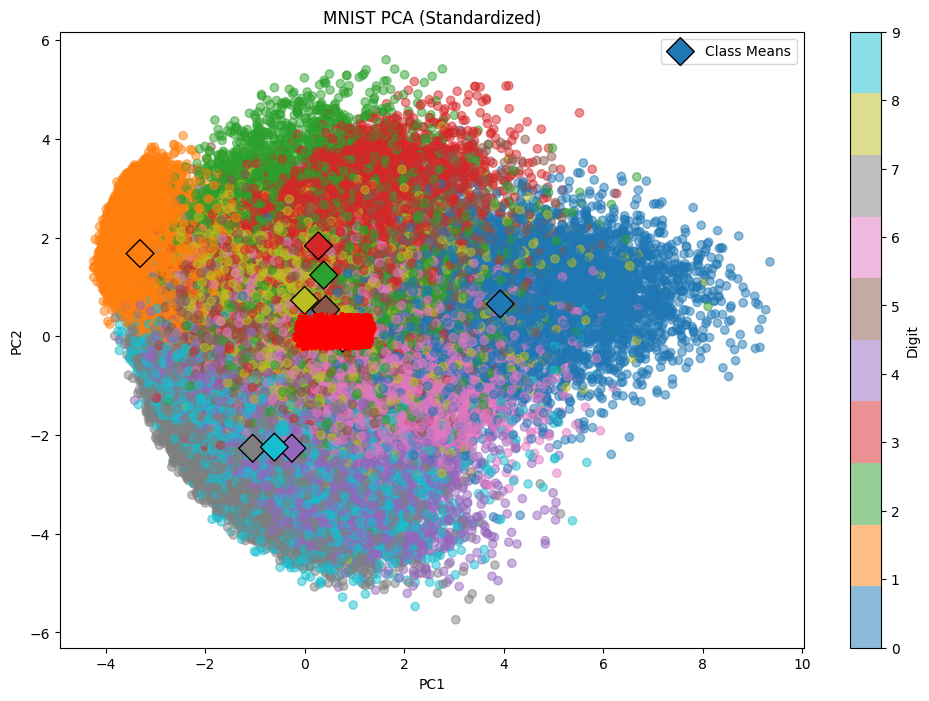

In [32]:
mnist_norm_minmax = mnist_flat / 255.0

mnPCA2, mnPCA2_data, mnPCA2_met = evaluate_method(PCA, mnist_norm_minmax, mnist_labels, n_components=2)

loadings = mnPCA2.components_.T * np.sqrt(mnPCA2.explained_variance_)
plot_pca(mnPCA2_data, loadings, mnist_labels, "MNIST PCA (Standardized)", "tab10")

The data now is noticeably more separated than before, with the meshing being severe mostly between the numbers 4, 9 and to a lesser extent 5, which is to be expected given their shape similarity.

##### COIL-20 

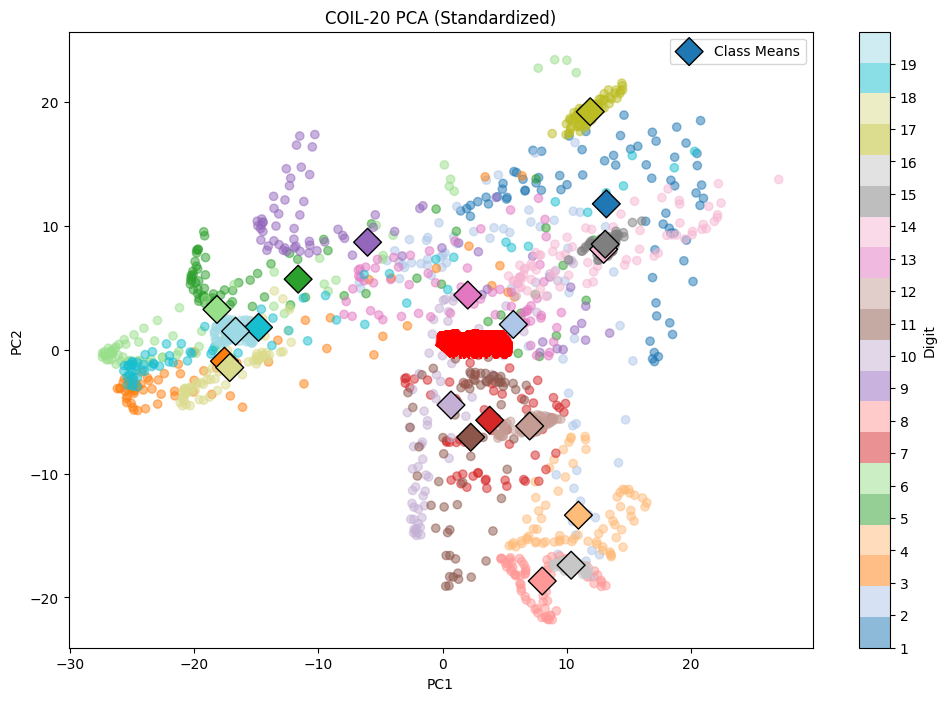

In [33]:
coilPCA2, coilPCA2_data, coilPCA2_met = evaluate_method(PCA, coil_normalized, coil_labels, n_components=2)

loadings = coilPCA2.components_.T * np.sqrt(coilPCA2.explained_variance_)

coil_labels = np.array([int(label) for label in coil_labels])
plot_pca(coilPCA2_data, loadings, coil_labels, "COIL-20 PCA (Standardized)", "tab20")

The data for the coil-20 dataset is noticeably more varied and less clustered, with close values sticking together.

#### Testing with 3D

The `plot_pca_3d` function visualizes PCA results in 3D, showing data points colored by labels and feature loadings as arrows. This helps interpret variance across the first three principal components and understand feature contributions. It uses Matplotlib’s 3D plotting (`ax`) for better insight into data structure and clustering.

In [34]:
def plot_pca_3d(scores, loadings, labels, title, colors):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2],
                         c=labels, alpha=0.5, cmap=colors)

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")

    for i, (x, y, z) in enumerate(loadings):
        ax.quiver(0, 0, 0, x, y, z, color='r', arrow_length_ratio=0.1)
        ax.text(x * 1.2, y * 1.2, z * 1.2, f"Pixel{i}", color='r')

    cbar = fig.colorbar(scatter, ticks=np.arange(len(unique_labels)), shrink=0.6)
    cbar.set_label('Digit')
    cbar.set_ticklabels(np.arange(len(unique_labels)))

    ax.set_title(title)
    plt.legend()
    plt.show()

##### MNIST

In [35]:
mnPCA3, mnPCA3_data, mnPCA3_met = evaluate_method(PCA, mnist_norm_minmax, mnist_labels, n_components=3)

loadings = mnPCA3.components_.T * np.sqrt(mnPCA3.explained_variance_)

/tmp/ipykernel_9594/1257771326.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


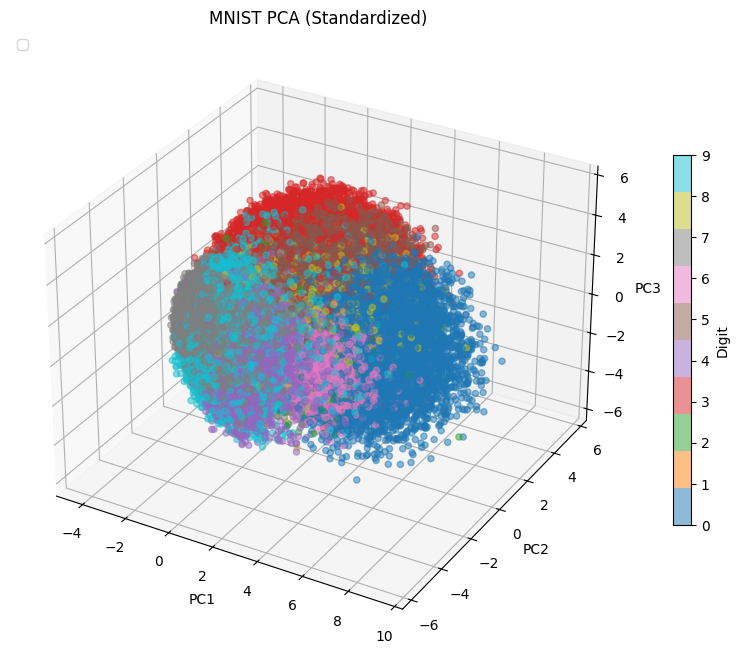

In [36]:
plot_pca_3d(mnPCA3_data, loadings, mnist_labels, "MNIST PCA (Standardized)", "tab10")

We can observe a bit of distinction but not by a large margin, the variance is still fairly low

In [37]:
mnPCA3.explained_variance_ratio_

array([0.09746116, 0.07155445, 0.06149531])

##### COIL-20

/tmp/ipykernel_9594/1257771326.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


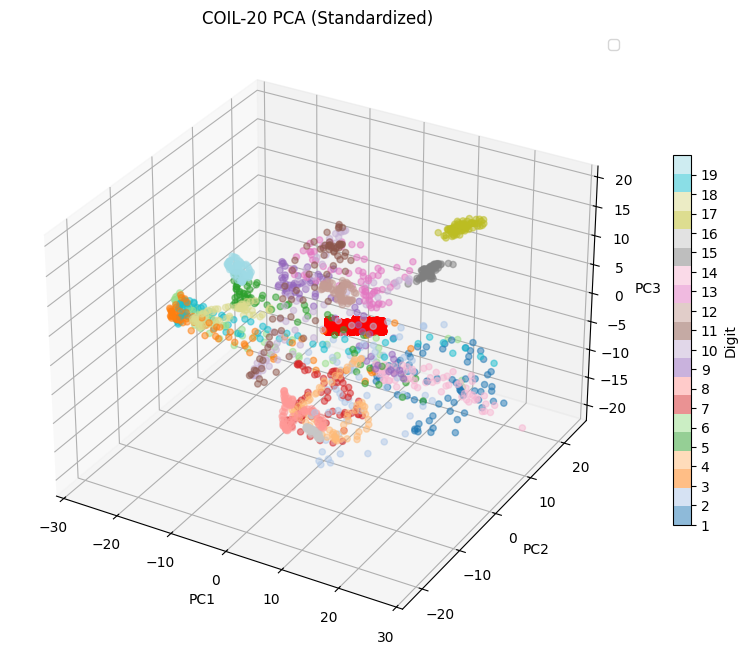

In [38]:
coilPCA3, coilPCA3_data, coilPCA3_met = evaluate_method(PCA, coil_normalized, coil_labels, n_components=3)

loadings = coilPCA3.components_.T * np.sqrt(coilPCA3.explained_variance_)

plot_pca_3d(coilPCA3_data, loadings, coil_labels, "COIL-20 PCA (Standardized)", "tab20")

We can see that some of the data has been clearly separated, reducing the variance.

However some clusters, especially for object 18, are too scattered.

### 7.2- t-SNE

From the **DataCamp Website**:
>**t-SNE (t-distributed Stochastic Neighbor Embedding)** is an unsupervised non-linear dimensionality reduction technique for data exploration and visualizing high-dimensional data. Non-linear dimensionality reduction means that the algorithm allows us to separate data that cannot be separated by a straight line.

Unlike PCA, t-SNE captures complex, non-linear structures—making it well-suited for datasets like MNIST and COIL-20, where class boundaries aren't linearly separable. However, as we will see later on, it is much more computationally intensive than PCA.

#### Testing with 2D

##### MNIST 

Tweaking the t-SNE method for the MNIST dataset proved challenging. Initially, computations were unfeasible due to the large dataset size. Once execution was achieved, the output was questionable, with the final **Kullback-Leibler divergence (KL)** divergence consistently exceeding Python's maximum float limit. We determined that increasing the number of iterations from 250 to 300 allowed the algorithm sufficient time to converge, resolving the issue.

In [39]:
mnTSNE2, mnTSNE2_data, mnTSNE2_met = evaluate_method(TSNE, mnist_norm_minmax, mnist_labels, n_components=2, init='pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

mnTSNE2.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.169s...
[t-SNE] Computed neighbors for 70000 samples in 78.110s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for sa

4.470054626464844

The KL divergence metric ranges from 0 to 10, with lower values indicating better preservation of structure during dimensionality reduction. Given the large size and complexity of our dataset, achieving a value of 4.47 suggests that t-SNE has performed robustly. We will further explore in the [Hyperparameter Tuning](#hyperparameter-tuning) section what adjustments can yield better results.

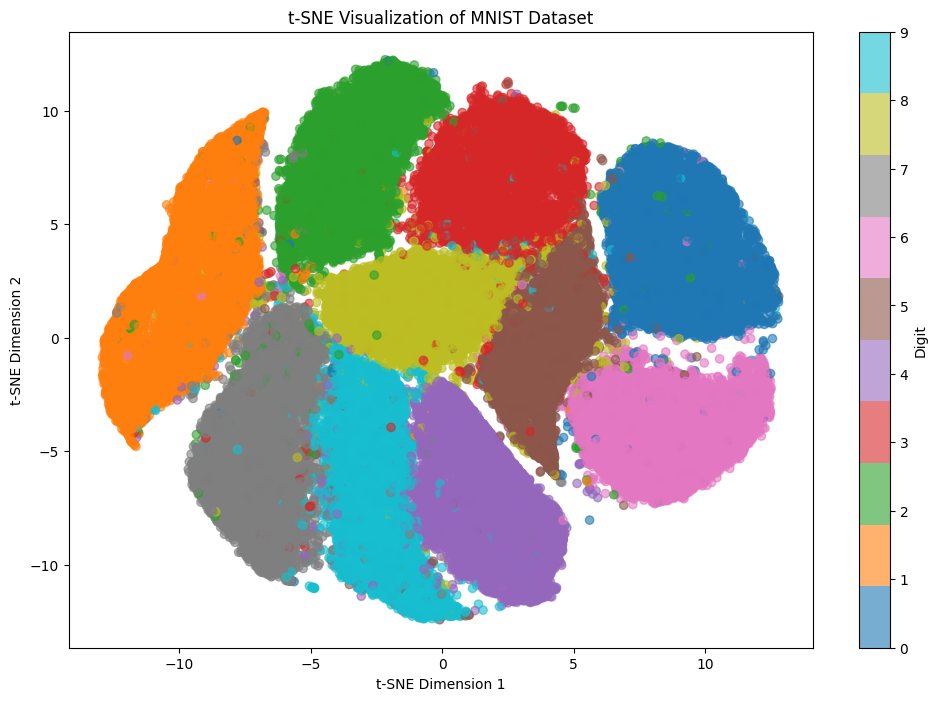

In [40]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(mnTSNE2_data[:, 0], mnTSNE2_data[:, 1], c=mnist_labels, cmap="tab10", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("t-SNE Visualization of MNIST Dataset")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

We notice that t-SNE in a 2D space gives us much beter results than PCA, with each number category properly clustered and separated and only a few intermingling values.

##### COIL-20

In [41]:
coilTSNE2, coilTSNE2_data, coilTSNE2_met = evaluate_method(TSNE, coil_normalized, coil_labels, n_components=2, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

coilTSNE2.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1440 samples in 0.001s...
[t-SNE] Computed neighbors for 1440 samples in 0.119s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1440
[t-SNE] Computed conditional probabilities for sample 1440 / 1440
[t-SNE] Mean sigma: 7.149989
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.823196
[t-SNE] KL divergence after 300 iterations: 0.953233


0.9532328844070435

The value of the kl divergence is very small here, signalling a high level of match up between the original data and reduced data.

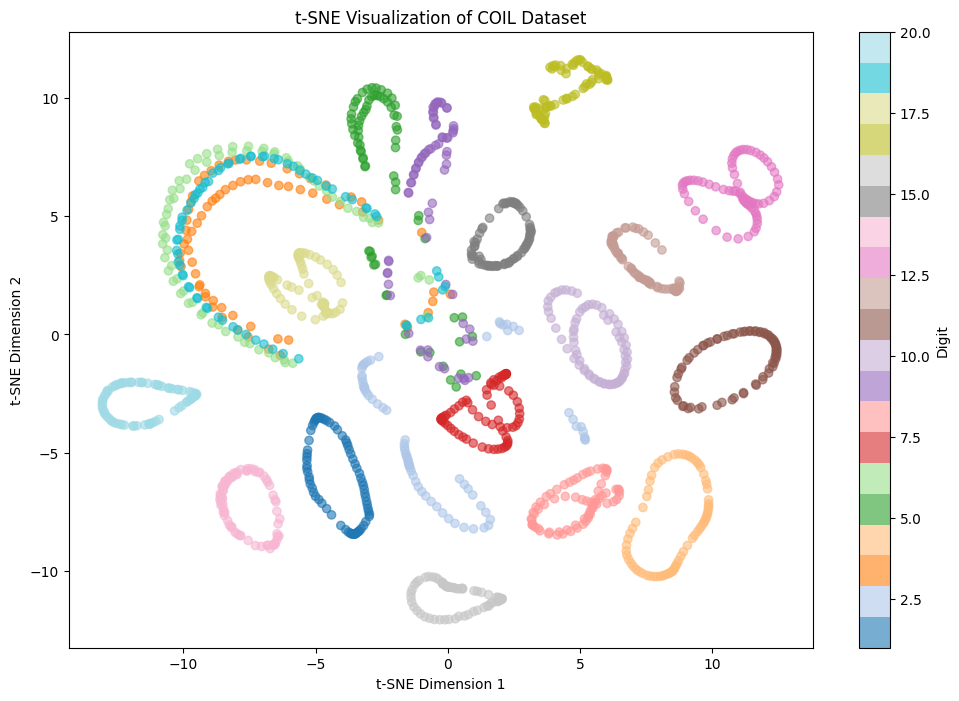

In [42]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(coilTSNE2_data[:, 0], coilTSNE2_data[:, 1], c=coil_labels, cmap="tab20", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("t-SNE Visualization of COIL Dataset")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

The clusters appear to be well-defined overall. The ring structure within each cluster *might* indicate how the rotations have been mapped for each object. 

However, some objects remain intertwined and mingled, which is not surprising given the heatmaps visualized earlier, hinting that some images' rotations are more stable than others, for example the cylindrical shapes might be assumed to be easier to concatenate than other shapes like that of the car or any irregular box shapes.

#### Testing with 3D

##### MNIST

In [43]:
mnTSNE3, mnTSNE3_data, mnTSNE3_met = evaluate_method(TSNE, mnist_norm_minmax, mnist_labels, n_components=3, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

mnTSNE3.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.225s...
[t-SNE] Computed neighbors for 70000 samples in 69.049s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for sa

4.07958984375

The 3D reduction gives approximately the same result but slightly better with a lower KL divergence for the **MNIST** dataset.

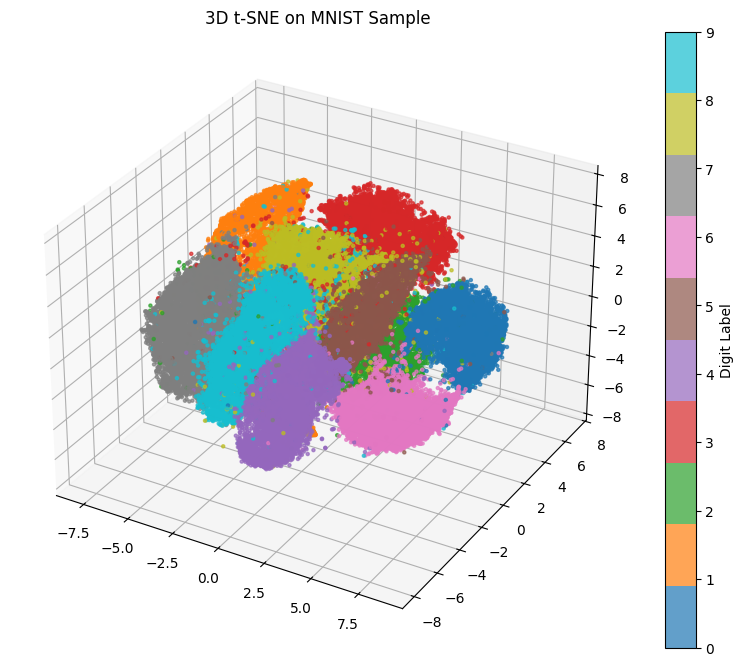

In [44]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    mnTSNE3_data[:, 0], 
    mnTSNE3_data[:, 1], 
    mnTSNE3_data[:, 2],
    c=mnist_labels,
    cmap='tab10',
    s=5, alpha=0.7
)

ax.set_title("3D t-SNE on MNIST Sample")
plt.colorbar(scatter, ax=ax, label='Digit Label')
plt.show()

The clustering for the **MNIST** dataset is much more neat and sparse than it was for PCA in 3D.

##### COIL-20

In [47]:
coilTSNE3, coilTSNE3_data, coilTSNE3_met = evaluate_method(TSNE, coil_normalized, coil_labels, n_components=3, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

coilTSNE3.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1440 samples in 0.001s...
[t-SNE] Computed neighbors for 1440 samples in 0.192s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1440
[t-SNE] Computed conditional probabilities for sample 1440 / 1440
[t-SNE] Mean sigma: 7.149989
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.295738
[t-SNE] KL divergence after 300 iterations: 0.779437


0.7794374227523804

The value for the **COIL-20** dataset in 3D t-SNE has gotten even lower than it was for 2D, this is a strong indication of an extremely close match-up between the original data and reduced data via the **t-SNE** method.

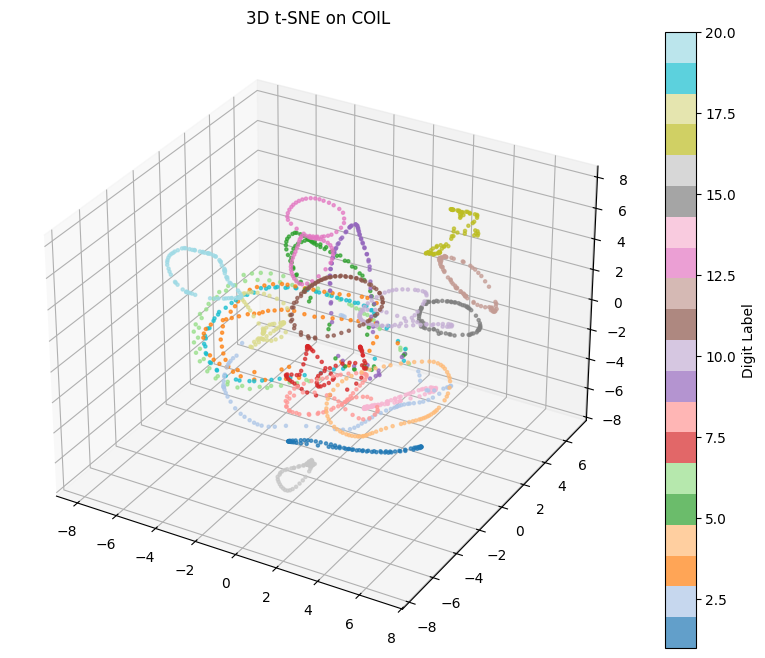

In [48]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    coilTSNE3_data[:, 0], 
    coilTSNE3_data[:, 1], 
    coilTSNE3_data[:, 2],
    c=coil_labels,
    cmap='tab20',
    s=5, alpha=0.7
)

ax.set_title("3D t-SNE on COIL")
plt.colorbar(scatter, ax=ax, label='Digit Label')
plt.show()

The values of the **COIL-20** dataset are very scattered though they do follow the ring pattern for each one.

### 7.3- UMAP

>**UMAP** is a non-linear dimensionality reduction method that preserves local structure by modeling data as a fuzzy topological space. It is effective for visualizing complex datasets and offers faster performance than t-SNE with comparable results.

We will see below how well it performs with the datasets, again in both 2D and 3D cases.

#### Testing with 2D

##### MNIST

In [49]:
mnUMAP2, mnUMAP2_data, mnUMAP2_met = evaluate_method(umap.UMAP, mnist_normalized, mnist_labels, n_components=2)

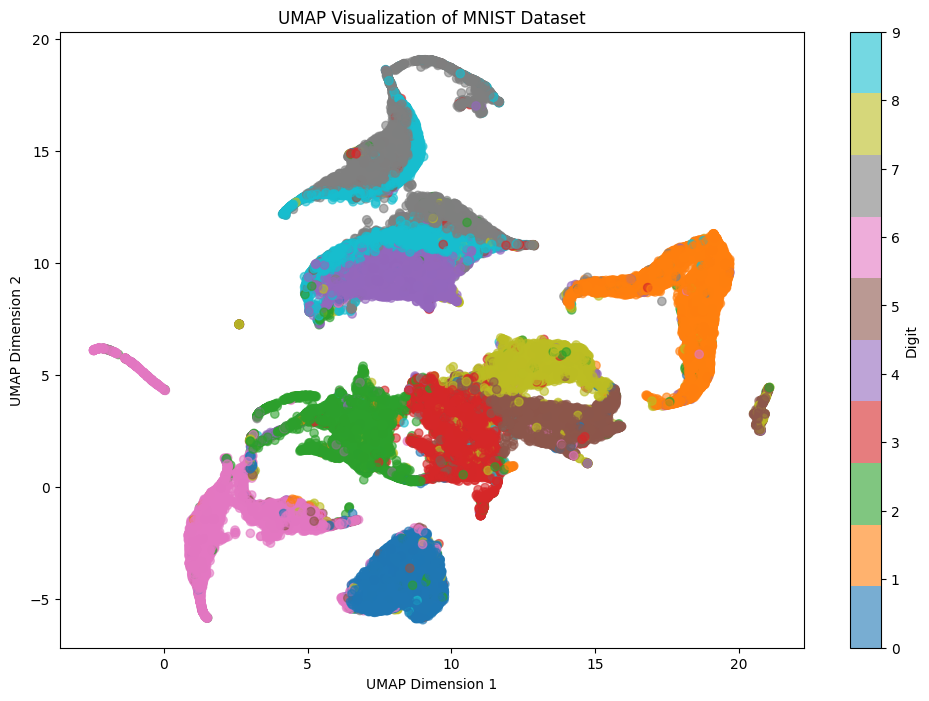

In [50]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(mnUMAP2_data[:, 0], mnUMAP2_data[:, 1], c=mnist_labels, cmap="tab10", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("UMAP Visualization of MNIST Dataset")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

The execution time is noticeably much less than it was for t-SNE, and provides remarkably more accurate results than PCA, though t-SNE's clustering is still more logical than the funny shaped graph we have here.

##### COIL-20

In [51]:
coilUMAP2, coilUMAP2_data, coilUMAP2_met = evaluate_method(umap.UMAP, coil_normalized, coil_labels, n_components=2)

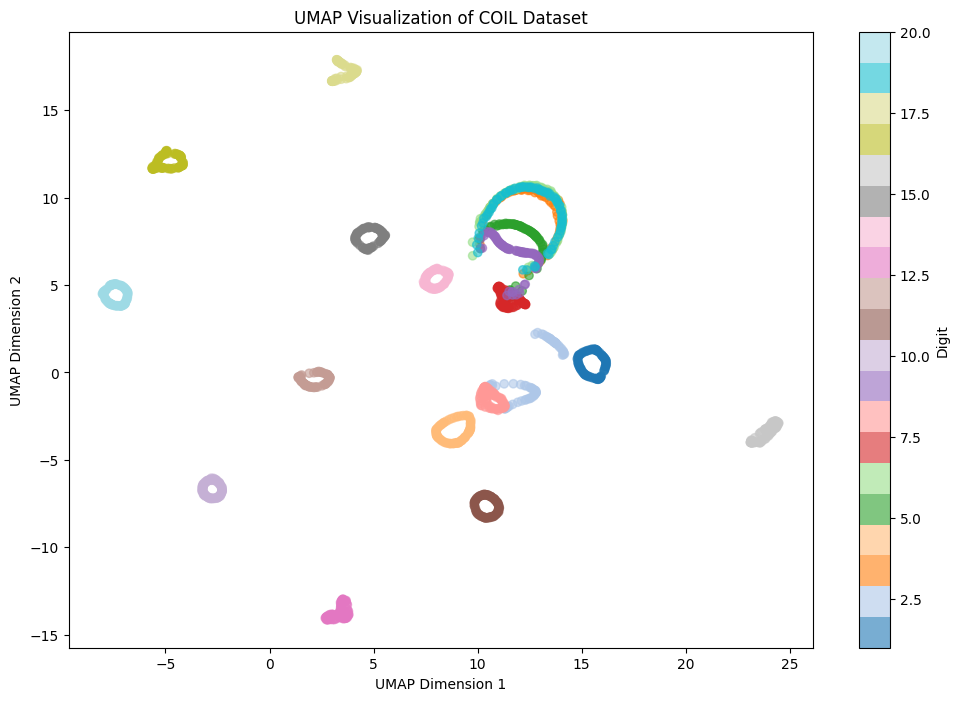

In [52]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(coilUMAP2_data[:, 0], coilUMAP2_data[:, 1], c=coil_labels, cmap="tab20", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("UMAP Visualization of COIL Dataset")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

**UMAP** and **t-SNE** exhibit comparable performance in terms of execution time for the **COIL-20** dataset due to its smaller size. Both methods reveal the ring structure, but UMAP produces more refined results with smaller, more tightly clustered rings.

#### Testing with 3D

##### MNIST

In [53]:
mnUMAP3, mnUMAP3_data, mnUMAP3_met = evaluate_method(umap.UMAP, mnist_normalized, mnist_labels, n_components=3)

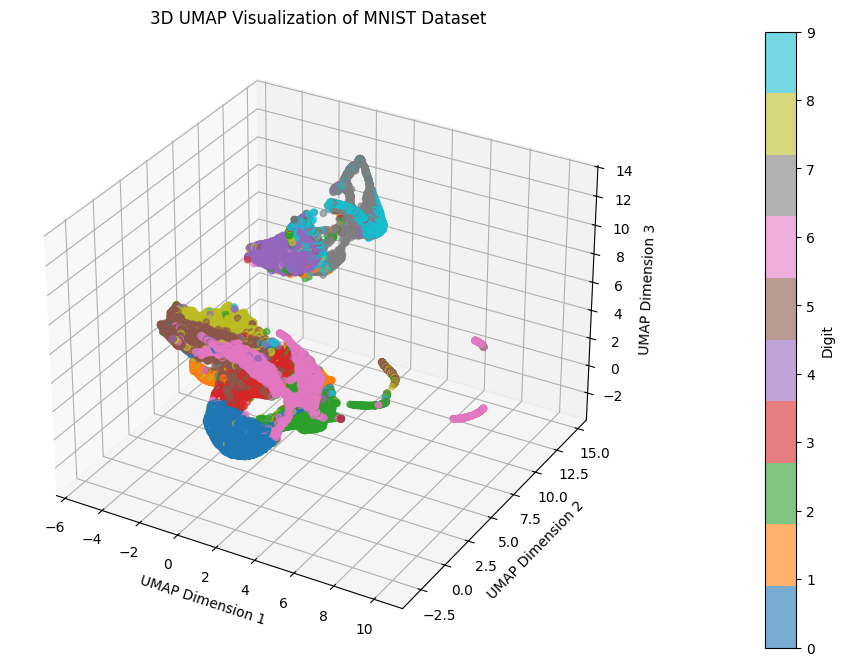

In [54]:
plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

scatter = ax.scatter3D(
    mnUMAP3_data[:, 0], 
    mnUMAP3_data[:, 1], 
    mnUMAP3_data[:, 2], 
    c=mnist_labels, 
    cmap="tab10", 
    alpha=0.6
)

plt.colorbar(scatter, label="Digit", pad=0.15)
ax.set_title("3D UMAP Visualization of MNIST Dataset")
ax.set_xlabel("UMAP Dimension 1")
ax.set_ylabel("UMAP Dimension 2")
ax.set_zlabel("UMAP Dimension 3")
plt.show()

**UMAP** still performs much better timewise in the **MNIST** dataset for the 3D visualization, taking only about *30 seconds* compared to the *11 minutes* of **t-SNE**. Its clusters however are not as neat and seem to intermingle a lot more, it is however still much better than **PCA**.

##### COIL-20

In [55]:
coilUMAP3, coilUMAP3_data, coilUMAP3_met = evaluate_method(umap.UMAP, coil_normalized, coil_labels, n_components=3)

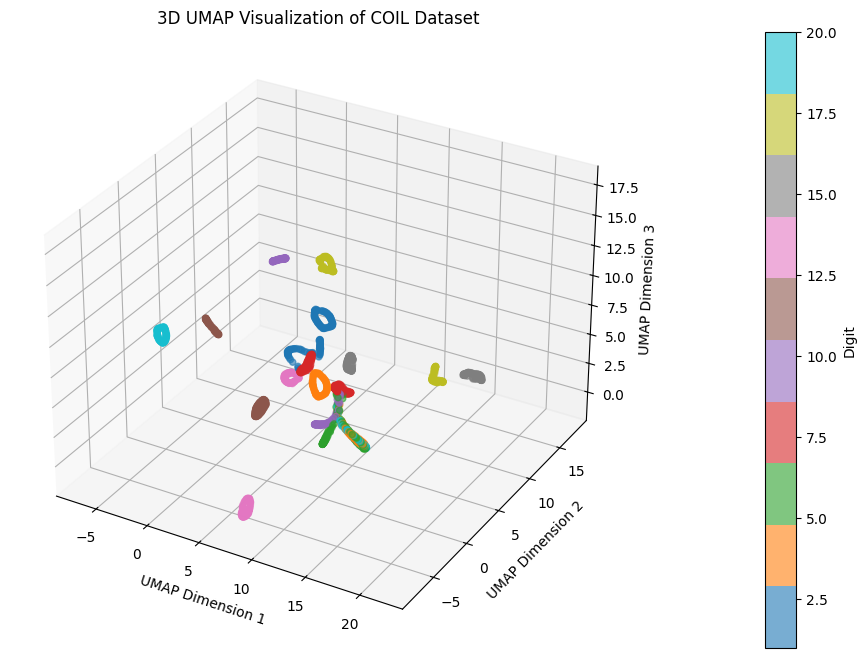

In [56]:
plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

scatter = ax.scatter3D(
    coilUMAP3_data[:, 0], 
    coilUMAP3_data[:, 1], 
    coilUMAP3_data[:, 2], 
    c=coil_labels, 
    cmap="tab10", 
    alpha=0.6
)

plt.colorbar(scatter, label="Digit", pad=0.15)
ax.set_title("3D UMAP Visualization of COIL Dataset")
ax.set_xlabel("UMAP Dimension 1")
ax.set_ylabel("UMAP Dimension 2")
ax.set_zlabel("UMAP Dimension 3")
plt.show()

As it was with the 2D visualization, **UMAP** and **t-SNE** perform very similarly timewise for the **COIL-20** dataset. Though **UMAP** yields better results in both cases and clearer definitions for the objects.

---

### 7.4- Evaluations and Performance Analysis

The RNX quality curve quantifies how well a dimensionality reduction method preserves local neighborhood relationships. It compares the ranking of neighbors in the high-dimensional space to that in the low-dimensional embedding over various neighborhood sizes. A more favorable (lower) RNX curve indicates that the method better maintains the intrinsic data structure during the reduction process.

The default graph of the `quality_curve` function produces only one method per graph, we will thus implement the method `add_curve()` in order to handle multiple methods within the same curve for a better assessment of performance.

In [57]:
methods = ['PCA', 'tSNE', 'UMAP']

def add_curve(ax, curve_data, area, label):
    size = curve_data.shape[0] + 1
    v = np.arange(size - 1)
    label = "method: {} area: {}".format(label, round(area * 100, 3))
    ax.plot(v, 100 * curve_data, label=label, marker="o", markevery=0.1)
    return ax

#### MNIST dataset

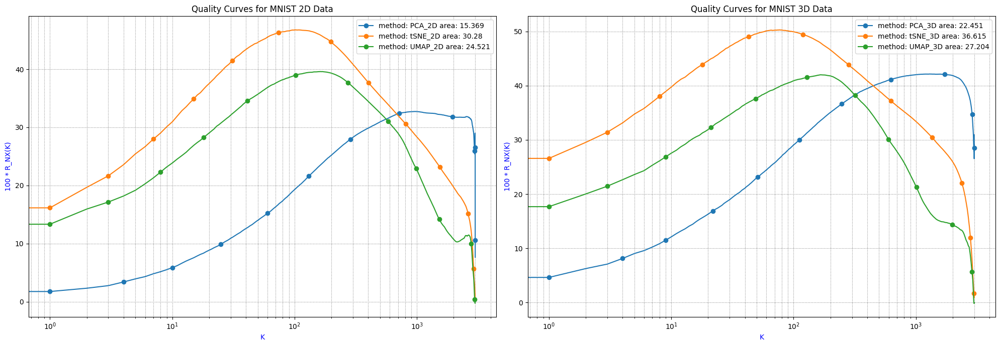

In [58]:
nearest_neighbors = 100
data_dict = {
    '2D': [mnPCA2_data, mnTSNE2_data, mnUMAP2_data],
    '3D': [mnPCA3_data, mnTSNE3_data, mnUMAP3_data]
}

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
for i, dim in enumerate(['2D', '3D']):
    ax = axes[i] 
    samples = {}
    data_list = data_dict[dim]
    for method, method_data in zip(methods, data_list):
        mnist_sample, _, data_sample, _ = train_test_split(mnist_norm_minmax, method_data, train_size=3000, random_state=42)
        samples[method] = {'mnist_sample': mnist_sample, 'data_sample': data_sample}
    for method in methods:
        d = samples[method]
        curve_data, area, curve_name = quality_curve(d['data_sample'], d['mnist_sample'], nearest_neighbors, 'r', False)
        ax = add_curve(ax, curve_data, area, f'{method}_{dim}')
    ax.set_xlabel('K', fontsize=10, color="blue")
    ax.set_ylabel('100 * ' + curve_name, fontsize=10, color="blue")
    ax.set_xscale('log')
    ax.set_title(f"Quality Curves for MNIST {dim} Data")
    ax.grid(True, which="both", ls='dotted', color='0.5')
    ax.legend()
plt.tight_layout()
plt.show()

All of the methods used so far don't seem to perform very well for the quality curve RNX on the **MNIST** dataset, with suboptimal values ranging from `15 to 30 for 2D` and a closer range of `22 to 28 for the 3D` values.

We do notice though that **t-SNE** does fare better than the others with overall better scores for both 2D and 3D, even if not by a large margin: `30.165 for 2d` and performing slightly worse for `3d at 28.867`.

#### COIL-20 dataset

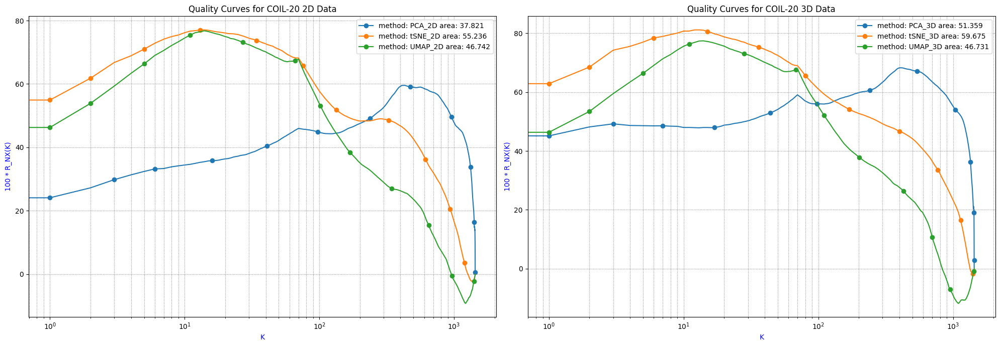

In [59]:
nearest_neighbors = 12
data_dict = {
    '2D': [coilPCA2_data, coilTSNE2_data, coilUMAP2_data],
    '3D': [coilPCA3_data, coilTSNE3_data, coilUMAP3_data]
}

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
for i, dim in enumerate(['2D', '3D']):
    ax = axes[i]
    data_list = data_dict[dim]
    for method, method_data in zip(methods, data_list):
        curve_data, area, curve_name = quality_curve(coil_normalized, method_data, nearest_neighbors, 'r', False)
        ax = add_curve(ax, curve_data, area, f'{method}_{dim}')
    ax.set_xlabel('K', fontsize=10, color="blue")
    ax.set_ylabel('100 * ' + curve_name, fontsize=10, color="blue")
    ax.set_xscale('log')
    ax.grid(True, which="both", ls='dotted', color='0.5')
    ax.set_title(f"Quality Curves for COIL-20 {dim} Data")
    ax.legend()
plt.tight_layout()
plt.show()

The methods are overall much more effective over the **COIL-20** dataset, signalling that it is much more uniform in terms of data, t-SNE still performs the best with a score of 59.563. We also notice that the curves for 2D and 3D are very similar.

We will now collect the results of the metrics for each method as obtained in the `evaluate_method()` function and compare the methods in more detail in this `results` pandas dataframe below.

Let us now take a look at the rest of the metrics in the `results` dataset.

In [60]:
index = pd.MultiIndex.from_product(
    [['MNIST', 'COIL-20'], ['2D', '3D'], ['PCA', 't-SNE', 'UMAP']],
    names=["Dataset", "Method", "Dimension"]
)

columns = pd.MultiIndex.from_tuples([
    ('Performance', 'Accuracy (%)'),
    ('Performance', 'Time (s)'),
    ('Performance', 'Memory (MB)'),
    ('Quality', 'Cluster Score')
])

results = pd.DataFrame(index=index, columns=columns)

In [61]:
# metrics for MNIST dataset
results.loc[('MNIST', '2D', 'PCA'), :] = mnPCA2_met
results.loc[('MNIST', '3D', 'PCA'), :] = mnPCA3_met
results.loc[('MNIST', '2D', 't-SNE'), :] = mnTSNE2_met
results.loc[('MNIST', '3D', 't-SNE'), :] = mnTSNE3_met
results.loc[('MNIST', '2D', 'UMAP'), :] = mnUMAP2_met
results.loc[('MNIST', '3D', 'UMAP'), :] = mnUMAP3_met

# metrics for COIL-20 dataset
results.loc[('COIL-20', '2D', 'PCA'), :] = coilPCA2_met
results.loc[('COIL-20', '3D', 'PCA'), :] = coilPCA3_met
results.loc[('COIL-20', '2D', 't-SNE'), :] = coilTSNE2_met
results.loc[('COIL-20', '3D', 't-SNE'), :] = coilTSNE3_met
results.loc[('COIL-20', '2D', 'UMAP'), :] = coilUMAP2_met
results.loc[('COIL-20', '3D', 'UMAP'), :] = coilUMAP3_met

/tmp/ipykernel_9594/829000493.py:2: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '2D', 'PCA'), :] = mnPCA2_met
/tmp/ipykernel_9594/829000493.py:3: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '3D', 'PCA'), :] = mnPCA3_met
/tmp/ipykernel_9594/829000493.py:4: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '2D', 't-SNE'), :] = mnTSNE2_met
/tmp/ipykernel_9594/829000493.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '3D', 't-SNE'), :] = mnTSNE3_met
/tmp/ipykernel_9594/829000493.py:6: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '2D', 'UMAP'), :] = mnUMAP2_met
/tmp/ipykernel_9594/829000493.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '3D', 'UMAP'), :] = mnUMAP3_met
/tmp/ipykernel_959

In [62]:
display(results.loc[('MNIST')])

Performance                                Quality
                 Accuracy (%)    Time (s)  Memory (MB) Cluster Score
Method Dimension                                                    
2D     PCA          41.071429    0.982786          0.0      0.022645
       t-SNE        96.595238  223.259192     5.105469      0.308034
       UMAP         91.604762   48.358108  1064.367188      0.306614
3D     PCA          48.409524    0.735981          0.0      0.025909
       t-SNE        96.880952  785.663507     1.539062      0.228111
       UMAP         93.019048    29.09017  1034.265625      0.290465

We notice that the overall statistics for the methods' results over the **MNIST** dataset point that:

- t-SNE is by far the most computationally expesenive interms of time, while UMAP consumes the most memory, though both perform best for the **cluster** score and overall **accuracy**.
- PCA has the lowest stats for both 2D and 3D, though it also doesn't consume any memory and its time is minimal, which is what drives its appeal in the first place, we will try if tweaking its parameters leads to better results.

In [63]:
display(results.loc[('COIL-20')])

Performance                             Quality
                 Accuracy (%)  Time (s) Memory (MB) Cluster Score
Method Dimension                                                 
2D     PCA          70.833333  0.085253    1.164062      0.002989
       t-SNE        90.509259   3.81549         0.0      0.381422
       UMAP         87.037037  5.868288        0.25      0.567099
3D     PCA          83.101852  0.132356         0.0      0.175319
       t-SNE        92.824074  6.011599         0.0      0.334472
       UMAP         86.342593  2.121487         0.0      0.580299

The methods perform very similarly for the **COIL-20** dataset, though we do notice that PCA has better scores here and isn't as far behind behind UMAP and t-SNE as before.

## 8- Hyperparameter Tuning

Let us now see how we can best exploit these methods for the best possible results on the datasets. 

In order to optimize runtime and for a smoother progress, we will sample (randomlu) the **MNIST** dataset size to be equal to the **COIL-20** dataset.

In [64]:
from itertools import product

# we can add more methods as needed
from sklearn.decomposition import KernelPCA

In [68]:
# list of methods to evaluate, more could be added for our usecase (only insert into both reducer_map and param_grid)
reducer_map = {
    "PCA": lambda **kwargs: PCA(**kwargs),
    "KernelPCA": lambda **kwargs: KernelPCA(**kwargs),
    "t-SNE": lambda **kwargs: TSNE(**kwargs),
    "UMAP": lambda **kwargs: umap.UMAP(**kwargs),
}

param_grid = {
    "PCA": {
        "n_components": [2, 3, 5, 10, 20],  
        "svd_solver": ["auto", "randomized"],
        "whiten": [True, False]
    },
    "KernelPCA": {
        "n_components": [2, 3, 5, 10, 20],
        "kernel": ["linear", "rbf", "poly", "sigmoid"],
        "gamma": [0.001, 0.01, 0.1, 1.0],          # Critical for RBF/poly/sigmoid
        "degree": [2, 3, 4],                       # For poly kernel
        "alpha": [0.1, 1.0, 10.0]                  # Regularization
    },
    "t-SNE": {
        "n_components": [2, 3],                    # t-SNE is mostly for 2D/3D
        "perplexity": [30, 50, 100],               # Higher for large datasets
        "learning_rate": [100, 200, 500],          # MNIST prefers ~200
        "early_exaggeration": [12, 24],            # Controls cluster separation
        "init": ["random", "pca"],                 # "pca" for better stability
        "metric": ["euclidean", "cosine"]          # Cosine works well for images
    },
    "UMAP": {
        "n_components": [2, 3],                   # UMAP can handle >2D
        "n_neighbors": [15, 30, 50],              # Larger for big datasets
        "min_dist": [0.01, 0.1, 0.5],             # Tighter clusters (MNIST)
        "metric": ["euclidean", "cosine"],        # Cosine for images
        "spread": [0.5, 1.0],                     # Controls density
        "local_connectivity": [1, 2]              # Manifold structure
    }
}

def evaluate_dataset(name, data, labels, param_grid, knn):
    scores = {}
    for method, grid in param_grid.items():
        keys, vals = zip(*grid.items())
        for combo in product(*vals):
            params = dict(zip(keys, combo))
            _, proj, _ = evaluate_method(reducer_map[method], data, labels, **params)
            _, area, _ = quality_curve(proj, data, knn, 'r', False)
            tag = method + "_" + "_".join(f"{k}{v}" for k, v in params.items())
            scores[tag] = area
        print(f"Finished evaluating {method} for {name}")
    return {name: scores}

In [66]:
mnist_sample, _, mnist_labels_sample, _ = train_test_split(
    mnist_norm_minmax, mnist_labels, train_size=1500, random_state=42
)

In [69]:
mnist_scores = evaluate_dataset("MNIST", mnist_sample, mnist_labels_sample, param_grid, nearest_neighbors)

Finished evaluating PCA for MNIST
Finished evaluating KernelPCA for MNIST
Finished evaluating t-SNE for MNIST
Finished evaluating UMAP for MNIST


Let us now see which method has performed best out of the four we currently have.

In [79]:
mnist_best = max(mnist_scores['MNIST'], key=mnist_scores['MNIST'].get)
best_score = mnist_scores['MNIST'][mnist_best]

print(f"Best Method: {mnist_best}")
print(f"Best Score: {best_score}")

Best Method: KernelPCA_n_components20_kernelsigmoid_gamma0.001_degree2_alpha0.1
Best Score: 0.6912604602415825


Surprisingly, KernelPCA yielded the best performance on the MNIST dataset,topping both t-SNE and UMAP with the following configuration:

- **Number of components:** 20

- **Kernel function:** Sigmoid, defined as $$K(x,y)=tanh⁡(γ⋅⟨x,y⟩+α)$$ This choice is intuitive, as the sigmoid kernel is capable of capturing complex nonlinear relationships, similar to activation functions in neural networks.

- **Gamma (γ):** 0.001 — a small value that ensures smoother, less sensitive variation in the kernel’s output.

- **Degree:** 2 — not applicable to the sigmoid kernel and likely just a default placeholder.

- **Alpha (α):** 0.1 — controls the offset in the sigmoid function, affecting the nonlinearity and scaling.

Although KernelPCA with these parameters reduced the data dimensionality by around 97%, other methods provided slightly greater reduction (up to 99%). Nevertheless, this configuration achieved the best performance overall with a score of `0.6912604602415825`.

In [80]:
coil_scores = evaluate_dataset("COIL-20", coil_normalized, coil_labels, param_grid, nearest_neighbors)

Finished evaluating PCA for COIL-20
Finished evaluating KernelPCA for COIL-20
Finished evaluating t-SNE for COIL-20
Finished evaluating UMAP for COIL-20


In [88]:
coil_best = max(coil_scores['COIL-20'], key=coil_scores['COIL-20'].get)
best_score = coil_scores['COIL-20'][coil_best]

print(f"Best Method: {coil_best}")
print(f"Best Score: {best_score}")

Best Method: PCA_n_components20_svd_solverrandomized_whitenFalse
Best Score: 0.8379511130203018


This time it is **PCA** which performs the best out of all the provided methods at a score of `0.83` with the following parameters:

- **Number of components:** 20

- **SVD-Solver:** randomized —the algorithm used to compute the principal components

- **Whiten:** false —determine whether or not the principal components should be scaled to have unit variance, set to false here to keep original data variance.

## 9- Clustering and Classification Analysis

We will now run **k-means clustering** and **k-NN classification** on our structured data using both reduced and original data matrices, exploring dimensionality reduction methods such as PCA, Kernel PCA, t-SNE, and UMAP (or others). 

We plan to compare the accuracy for k-NN across different representations, use an unsupervised metric like the Silhouette Score to evaluate k-means, and discuss the interpretability along with the clustering structure revealed by these various reduction techniques.

In [ ]:
def get_best_parameters(scores):
    best_params = {}
    for dataset, methods_scores in scores.items():
        for method_param, score in methods_scores.items():
            method = method_param.split('_')[0]  # Extract method name
            if method not in best_params or score > best_params[method]['score']:
                best_params[method] = {'params': method_param, 'score': score}
    return best_params

mnist_best_params = get_best_parameters(mnist_scores)
coil_best_params = get_best_parameters(coil_scores)

print("Best Parameters for MNIST:")
for method, details in mnist_best_params.items():
    print(f"{method}: {details['params']} with score {details['score']}")

print("\nBest Parameters for COIL-20:")
for method, details in coil_best_params.items():
    print(f"{method}: {details['params']} with score {details['score']}")

Best Parameters for MNIST:
PCA: PCA_n_components20_svd_solverauto_whitenFalse with score 0.6911953654672016
KernelPCA: KernelPCA_n_components20_kernelsigmoid_gamma0.001_degree2_alpha0.1 with score 0.6912604602415825
t-SNE: t-SNE_n_components3_perplexity50_learning_rate200_early_exaggeration12_initrandom_metriceuclidean with score 0.5267170708280395
UMAP: UMAP_n_components3_n_neighbors15_min_dist0.5_metriceuclidean_spread1.0_local_connectivity1 with score 0.3923206891052259

Best Parameters for COIL-20:
PCA: PCA_n_components20_svd_solverrandomized_whitenFalse with score 0.8379511130203018
KernelPCA: KernelPCA_n_components20_kernellinear_gamma0.001_degree2_alpha0.1 with score 0.8379209606007962
t-SNE: t-SNE_n_components3_perplexity30_learning_rate100_early_exaggeration12_initpca_metriceuclidean with score 0.6733148645156146
UMAP: UMAP_n_components3_n_neighbors50_min_dist0.5_metriceuclidean_spread1.0_local_connectivity2 with score 0.5168618632647543


In [101]:
mnist_methods = {
    "PCA": PCA(n_components=20, svd_solver='auto', whiten=False),
    "KernelPCA": KernelPCA(n_components=20, kernel='sigmoid', gamma=0.001, degree=2, alpha=0.1, fit_inverse_transform=True),
    "t-SNE": TSNE(n_components=3, perplexity=50, learning_rate=200, early_exaggeration=12, init='random', metric='euclidean'),
    "UMAP": umap.UMAP(n_components=3, n_neighbors=15, min_dist=0.5, metric='euclidean', spread=1.0, local_connectivity=1)
}

coil20_methods = {
    "PCA": PCA(n_components=20, svd_solver='randomized', whiten=False),
    "KernelPCA": KernelPCA(n_components=20, kernel='linear', gamma=0.001, degree=2, alpha=0.1, fit_inverse_transform=True),
    "t-SNE": TSNE(n_components=3, perplexity=30, learning_rate=100, early_exaggeration=12, init='pca', metric='euclidean'),
    "UMAP": umap.UMAP(n_components=3, n_neighbors=50, min_dist=0.5, metric='euclidean', spread=1.0, local_connectivity=2)
}

In [89]:
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score, adjusted_rand_score


def evaluate_clustering(data, labels=None, n_clusters=None):
    kmeans = KMeans(n_clusters=n_clusters or len(np.unique(labels)), n_init='auto', random_state=42)
    preds = kmeans.fit_predict(data)

    sil = silhouette_score(data, preds)
    db = davies_bouldin_score(data, preds)
    
    if labels is not None:
        ari = adjusted_rand_score(labels, preds)
    else:
        ari = None
        
    return {
        'silhouette': sil,
        'davies_bouldin': db,
        'adjusted_rand': ari
    }


In [102]:
best_methods = {'MNIST': mnist_methods, 'COIL-20': coil20_methods}

def evaluate_knn(data, labels):
    X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=42)
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train, y_train)
    return accuracy_score(y_test, knn.predict(X_test)) * 100

def full_evaluation(name, data, labels):
    results = {}
    original_knn_acc = evaluate_knn(data, labels)
    original_clustering = evaluate_clustering(data, labels)

    results["Original"] = {
        "knn_accuracy": original_knn_acc,
        "clustering": original_clustering
    }

    for method_name, reducer in best_methods[name].items():
        reduced = reducer.fit_transform(data)
        knn_acc = evaluate_knn(reduced, labels)
        clustering_scores = evaluate_clustering(reduced, labels)

        results[method_name] = {
            "knn_accuracy": knn_acc,
            "clustering": clustering_scores
        }

    return {name: results}


In [104]:
mnist_all = full_evaluation("MNIST", mnist_sample, mnist_labels_sample)

We can see here that the **original** and **reduced** data have near similar scores for all metrics used over the **MNIST** dataset, with k-nn having the exact same score and clustering matching up until the 16th digit after the decimal point.

In [ ]:
coil_all = full_evaluation("COIL-20", coil_normalized, coil_labels)

In [94]:
coil_all

{'COIL-20': {'Original': {'knn_accuracy': 95.13888888888889,
   'clustering': {'silhouette': np.float64(0.2287979762920916),
    'davies_bouldin': np.float64(1.7658832011439358),
    'adjusted_rand': 0.547015680012433}},
  'PCA_n_components20_svd_solverrandomized_whitenFalse': {'knn_accuracy': 95.13888888888889,
   'clustering': {'silhouette': np.float64(0.22879797629209145),
    'davies_bouldin': np.float64(1.7658832011439365),
    'adjusted_rand': 0.547015680012433}}}}

We observe a similar trend for the **COIL-20** dataset, we can also see that the data for this dataset is overall much better clustered and divided than the **MNIST** dataset, which matches all previous analyses.